# Primera entrega del proyecto final

### Objetivos Generales:

1. Entender el problema de negocio e identificar los elementos a ser considerados para el planteamiento de un Modelo de Data Science.

2. Describir los datos de negocio y las relaciones entre datos mediante el Análisis Exploratorio de Datos.

3. Construir una presentación ejecutiva para la alta gerencia mostrando los resultados obtenidos.


### Objetivos Específicos:

1. Desarrollar las instancias de Data Acquisition y Data Wrangling en tu trabajo final.

2. Lograr una articulación en equipo y una división de tareas adecuadas a los objetivos.

3. Realizar Filtrado

4. Describir qué significa cada variable, cómo se comporta.

5. Especificar las distribuciones y relaciones (géneros, sexo, edad, IVA, tipo de empresa).

### Se debe entregar:

1. Presentación de la empresa, organización o problema específico.

2. Preguntas y objetivos de la investigación.

3. Conformación del equipo de trabajo.

4. Indicación de la fuente del dataset y los criterios de selección (Data Acquisition).

5. Generación del primer Data Wrangling y EDA, apuntado a sus datos (insights) univariado, bivariado y multivariado.

6. Análisis de componentes principales.

7. Contar la historia de sus datos

8. Filtros aplicados a los datos. Distribución. Dataset final para analizar.

9. Palttear objetivos u objetivo para esos datos.


### Introducción

Spotify, fundada el 23 de abril de 2006, es el proveedor de servicios de transmisión de música más grande del mundo, con más de 365 millones de usuarios activos mensuales, incluidos 165 millones de suscriptores de pago, a partir de junio de 2021.

En las aplicaciones de Spotify, la música se puede explorar o buscar a través de varios parámetros, como artista, álbum, género, lista de reproducción o sello discográfico. Los usuarios pueden crear, editar y compartir listas de reproducción, compartir pistas en las redes sociales y crear listas de reproducción con otros usuarios. Spotify brinda acceso a más de 70 millones de canciones, 2,2 millones de podcasts y 4 mil millones de listas de reproducción.

Como un servicio de transmisión de música popular, es utilizado diariamente por una gran cantidad de personas en todo el mundo. Una forma en que Spotify mantiene a sus usuarios no solo satisfechos, sino también enganchados a la plataforma, es haciendo recomendaciones inteligentes y personales a los usuarios en función de su historial de escucha.

Este tipo de sistemas de recomendación son utilizados por muchas más empresas para proporcionar una experiencia de usuario muy personal.

En este cuaderno, desarrollaremos un análisis básico del conjunto de datos de 600K canciones de Spotify. La idea principal es preparar el dataframe para entrenar un modelo que será capaz de recomendarnos una lista de canciones cuando le demos solo una, es similar a la radio de Spotify.

### Descripción de los datos

Yamac Eren Ay ha recopilado un conjunto de datos de Spotify, que contiene detalles de ~600 000 canciones/pistas, utilizando la API web de Spotify. Este increíble conjunto de datos está disponible en Kaggle, échale un vistazo aquí --> https://www.kaggle.com/code/prathamsharma123/spotify-eda-recommendation-system/data

#### Algunas de las funciones de audio que describen canciones/pistas son:

1. `Loudness`: qué tan fuerte es la canción.
2. `Popularidad`: Cuán popular es la pista entre los usuarios
3. `Acústica`: Si la canción/pista es acústica o no.
4. `Tempo`: El tempo de la canción/pista, medido en pulsaciones por minuto (BPM).
5. `Energy`: Cuán enérgica es la canción/pista.
6. `Viveness`: Si una audiencia en vivo está presente o si la canción/pista está grabada en estudio.
7. `Valence`: Qué tan positiva es la música.
8. `Bailabilidad`: Nos dice si la canción es más bailable o no.
9. `Energy`: Cuánta energía existe en la canción.
10. `Speechiness`: Esto puede usarse para identificar si la canción está cantada o no.
11. `Instrumentalidad`: Nos mostrará la cantidad de sonidos instrumentales que contendrán las canciones.

### Equipo:

1. Fernández Nicolas
2. Luca Falchini
3. Fabian Pizzatti

In [1]:
# Libs import
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import FormatStrFormatter
from seaborn import boxplot, violinplot
from pandas_profiling import ProfileReport
from funcs import get_frec_acum, graph_histplot_boxplot

# Tratamiento de datos
# ==============================================================================
import statsmodels.api as sm

# Preprocesado y modelado
# ==============================================================================
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import scale

# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Reading dataset
df = pd.read_csv('Data/tracks.csv')
df.head()

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,['Uli'],['45tIt06XoI0Iio4LBEVpls'],1922-02-22,0.645,0.4450,0,-13.338,1,0.4510,0.674,0.7440,0.151,0.127,104.851,3
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,['Fernando Pessoa'],['14jtPCOoNZwquk5wd9DxrY'],1922-06-01,0.695,0.2630,0,-22.136,1,0.9570,0.797,0.0000,0.148,0.655,102.009,1
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.434,0.1770,1,-21.180,1,0.0512,0.994,0.0218,0.212,0.457,130.418,5
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.321,0.0946,7,-27.961,1,0.0504,0.995,0.9180,0.104,0.397,169.980,3
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922,0.402,0.1580,3,-16.900,0,0.0390,0.989,0.1300,0.311,0.196,103.220,4


### Exploratory Data Analysis (EDA)

In [3]:
# null's verification
df.isnull().sum()

id                   0
name                71
popularity           0
duration_ms          0
explicit             0
artists              0
id_artists           0
release_date         0
danceability         0
energy               0
key                  0
loudness             0
mode                 0
speechiness          0
acousticness         0
instrumentalness     0
liveness             0
valence              0
tempo                0
time_signature       0
dtype: int64

In [4]:
df.shape

(586672, 20)

In [5]:
df.count()

id                  586672
name                586601
popularity          586672
duration_ms         586672
explicit            586672
artists             586672
id_artists          586672
release_date        586672
danceability        586672
energy              586672
key                 586672
loudness            586672
mode                586672
speechiness         586672
acousticness        586672
instrumentalness    586672
liveness            586672
valence             586672
tempo               586672
time_signature      586672
dtype: int64

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 586672 entries, 0 to 586671
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   id                586672 non-null  object 
 1   name              586601 non-null  object 
 2   popularity        586672 non-null  int64  
 3   duration_ms       586672 non-null  int64  
 4   explicit          586672 non-null  int64  
 5   artists           586672 non-null  object 
 6   id_artists        586672 non-null  object 
 7   release_date      586672 non-null  object 
 8   danceability      586672 non-null  float64
 9   energy            586672 non-null  float64
 10  key               586672 non-null  int64  
 11  loudness          586672 non-null  float64
 12  mode              586672 non-null  int64  
 13  speechiness       586672 non-null  float64
 14  acousticness      586672 non-null  float64
 15  instrumentalness  586672 non-null  float64
 16  liveness          58

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
popularity,586672.0,27.570053,18.370642,0.0,13.0000,27.000000,41.00000,100.000
duration_ms,586672.0,230051.167286,126526.087418,3344.0,175093.0000,214893.000000,263867.00000,5621218.000
explicit,586672.0,0.044086,0.205286,0.0,0.0000,0.000000,0.00000,1.000
danceability,586672.0,0.563594,0.166103,0.0,0.4530,0.577000,0.68600,0.991
energy,586672.0,0.542036,0.251923,0.0,0.3430,0.549000,0.74800,1.000
key,586672.0,5.221603,3.519423,0.0,2.0000,5.000000,8.00000,11.000
loudness,586672.0,-10.206067,5.089328,-60.0,-12.8910,-9.243000,-6.48200,5.376
mode,586672.0,0.658797,0.474114,0.0,0.0000,1.000000,1.00000,1.000
speechiness,586672.0,0.104864,0.179893,0.0,0.0340,0.044300,0.07630,0.971
acousticness,586672.0,0.449863,0.348837,0.0,0.0969,0.422000,0.78500,0.996


Hagamos algunos perfiles de datos para que podamos tener una idea general de todas las variables en el conjunto de datos

In [8]:
#Data Profiling
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Análisis de Componentes Principales (PCA)

In [9]:
# dropeo todos las columnas que no son numericas
numerical_df = df.copy()
numerical_df.drop(['duration_ms', 'mode', 'time_signature', 'explicit', 'key', 'mode', 'id', 'name', 'artists', 'id_artists', 'release_date'], axis=1, inplace=True)

In [10]:
numerical_df.head()

,popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,6,0.645,0.4450,-13.338,0.4510,0.674,0.7440,0.151,0.127,104.851
1,0,0.695,0.2630,-22.136,0.9570,0.797,0.0000,0.148,0.655,102.009
2,0,0.434,0.1770,-21.180,0.0512,0.994,0.0218,0.212,0.457,130.418
3,0,0.321,0.0946,-27.961,0.0504,0.995,0.9180,0.104,0.397,169.980
4,0,0.402,0.1580,-16.900,0.0390,0.989,0.1300,0.311,0.196,103.220


In [11]:
escalar = StandardScaler()
datos_escalados = escalar.fit(numerical_df)
datos_escalados = escalar.transform(numerical_df)
datos_escalados

array([[-1.17415988,  0.49009603, -0.38518157, ..., -0.34143424,
        -1.65052699, -0.45739212],
       [-1.50076822,  0.79111496, -1.10762533, ..., -0.3577098 ,
         0.39859992, -0.55287633],
       [-1.50076822, -0.78020384, -1.44899985, ..., -0.01049783,
        -0.36982267,  0.40159623],
       ...,
       [ 2.30966248, -0.17214561, -0.9051823 , ..., -0.68647614,
        -1.88609896,  0.89470735],
       [ 1.65644579,  0.79713533,  0.28962853, ...,  0.49404457,
        -0.44356019, -0.95537488],
       [ 0.5677513 ,  0.73693155,  0.71833141, ...,  0.2716119 ,
         1.64049501, -0.21034939]])

In [12]:
pca_model = PCA(n_components = 10)
pca_model.fit(datos_escalados)
pca_model.components_

array([[-0.28502657, -0.2859307 , -0.49443963, -0.46790239,  0.03026362,
         0.43855756,  0.25517905, -0.01652159, -0.29359502, -0.16960051],
       [-0.14856122,  0.52429177, -0.12803465, -0.16400956,  0.574989  ,
         0.18212421, -0.20337193,  0.13980102,  0.4083261 , -0.26141815],
       [ 0.02308768, -0.33595517,  0.15811908,  0.05330986,  0.37662604,
        -0.09420968, -0.09769759,  0.7852295 , -0.28582509,  0.014446  ],
       [ 0.58651495,  0.03941559, -0.16263697, -0.00903721,  0.08867805,
        -0.05491394, -0.38217542, -0.21007664, -0.42714504, -0.49435989],
       [-0.12657007,  0.08038108,  0.23355983,  0.12757329, -0.20071855,
        -0.15991978,  0.50845068,  0.15543184,  0.05207267, -0.74527765],
       [ 0.33869476,  0.14700221,  0.05690288, -0.23121551,  0.47341175,
        -0.27698994,  0.62326356, -0.18584066, -0.15320897,  0.24427105],
       [ 0.58935247,  0.18119807, -0.19905595, -0.15568926, -0.38732855,
         0.28117898,  0.17752208,  0.45250211

In [13]:
# Se combierte el array a dataframe para añadir nombres a los ejes. #vector de loadings, cargas
pd.DataFrame(
    data    = pca_model.components_,
    columns = numerical_df.columns,
    index   = ['PC1', 'PC2', 'PC3','PC4','PC5', 'PC6', 'PC7','PC8','PC9', 'PC10']
) 

,popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
PC1,-0.285027,-0.285931,-0.494440,-0.467902,0.030264,0.438558,0.255179,-0.016522,-0.293595,-0.169601
PC2,-0.148561,0.524292,-0.128035,-0.164010,0.574989,0.182124,-0.203372,0.139801,0.408326,-0.261418
PC3,0.023088,-0.335955,0.158119,0.053310,0.376626,-0.094210,-0.097698,0.785230,-0.285825,0.014446
PC4,0.586515,0.039416,-0.162637,-0.009037,0.088678,-0.054914,-0.382175,-0.210077,-0.427145,-0.494360
PC5,-0.126570,0.080381,0.233560,0.127573,-0.200719,-0.159920,0.508451,0.155432,0.052073,-0.745278
PC6,0.338695,0.147002,0.056903,-0.231216,0.473412,-0.276990,0.623264,-0.185841,-0.153209,0.244271
PC7,0.589352,0.181198,-0.199056,-0.155689,-0.387329,0.281179,0.177522,0.452502,0.280403,0.109477
PC8,-0.170367,0.172174,-0.149018,-0.581383,-0.272622,-0.662360,-0.201381,0.162249,-0.032789,0.010993
PC9,0.212055,-0.647797,0.126405,-0.291453,0.143195,-0.104030,-0.073674,-0.163958,0.582933,-0.176127
PC10,0.009690,0.136946,0.743026,-0.484065,-0.097483,0.362912,-0.115952,-0.052955,-0.192941,0.007870


In [14]:
# Porcentaje de varianza explicada acumulada
# ==============================================================================
prop_varianza_acum = pca_model.explained_variance_ratio_.cumsum()
print('------------------------------------------')
print('Porcentaje de varianza explicada acumulada')
print('------------------------------------------')
print(prop_varianza_acum)

------------------------------------------
Porcentaje de varianza explicada acumulada
------------------------------------------
[0.3080708  0.45152462 0.56907855 0.67500685 0.76282834 0.8415035
 0.90450159 0.9481916  0.98646994 1.        ]


In [15]:
proyecciones = np.dot(pca_model.components_, scale(numerical_df).T)
proyecciones = pd.DataFrame(proyecciones, index = ['PC1', 'PC2', 'PC3','PC4','PC5', 'PC6', 'PC7','PC8','PC9', 'PC10'])
proyecciones = proyecciones.transpose().set_index(numerical_df.index)
proyecciones

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,2.183676,0.722369,0.344887,-0.365932,0.933800,2.204899,-1.243252,-0.732673,-1.226798,0.172008
1,2.299970,4.412654,0.728498,0.058375,-1.253077,1.659227,-1.896726,-0.022325,0.706947,0.291859
2,3.004274,0.278021,-0.239090,-0.675048,-1.170656,-0.837513,0.026980,0.723026,0.168178,0.555803
3,4.694633,-1.027722,-0.837647,-2.355151,-0.857598,1.911341,0.590037,0.679483,0.433737,0.563071
4,3.241771,-0.174954,0.492796,-0.066581,-0.162658,-1.007845,-0.170662,0.268810,-0.517335,0.180492
...,...,...,...,...,...,...,...,...,...,...
586667,0.079730,-1.020987,-0.408581,1.310993,-0.926409,0.013994,0.320450,-1.028916,-0.743550,0.418740
586668,-2.556433,-0.305503,-0.832312,0.962049,-0.868695,0.977511,1.121703,-0.224425,-0.182067,-0.235204
586669,0.932920,-1.219179,-0.259266,2.067874,-1.803358,0.672782,1.270070,-0.691623,-0.660227,0.529478
586670,-1.353271,-0.122010,0.319070,1.672900,0.762052,-0.000483,0.814891,0.095099,-0.480511,-0.153855


El analisis del PCA nos muestra que ninguna de las variables representa o tiene un peso importante como para decir que analizandola sola nos permitirá hacer una buena predicción. La de mayor varianza es popularity y solo es el 0.3 por lo que descartamos ir por este camino.

#### Analisis univariado, bivariado y multivariado

Ahora, crearemos un mapa de calor para que podamos ver qué tan fuerte es la relación entre las variables.

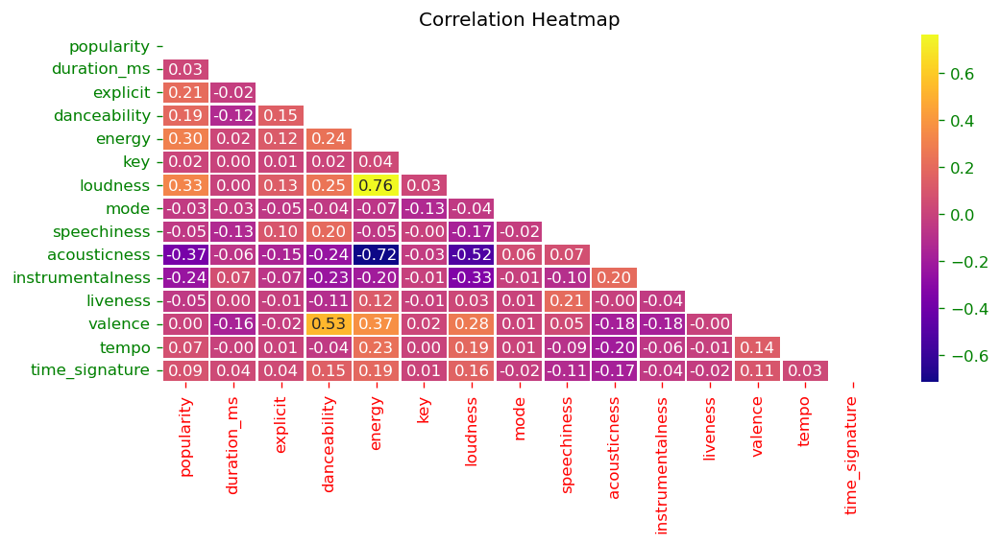

In [16]:
# Correlation matrix using heatmap
with plt.rc_context({'axes.edgecolor':'orange', 'xtick.color':'red', 'ytick.color':'green', 'figure.facecolor':'white'}):
    plt.figure(dpi = 120,figsize= (10,4))
    mask = np.triu(np.ones_like(df.corr(),dtype = bool))
    sns.heatmap(df.corr(),mask = mask, fmt = ".2f",annot=True,lw=1,cmap = 'plasma')
    plt.yticks(rotation = 0)
    plt.xticks(rotation = 90)
    plt.title('Correlation Heatmap')
    plt.show()

En primer lugar, enfocaremos nuestro análisis sobre la popularidad porque es uno de los campos más importantes en nuestro conjunto de datos para crear un algoritmo de recomendación. La opinión del usuario nos dará información fidedigna sobre una buena recomendación

In [17]:
df.popularity.describe()

count    586672.000000
mean         27.570053
std          18.370642
min           0.000000
25%          13.000000
50%          27.000000
75%          41.000000
max         100.000000
Name: popularity, dtype: float64

Distribución de la `popularidad` (análisis bivariado)

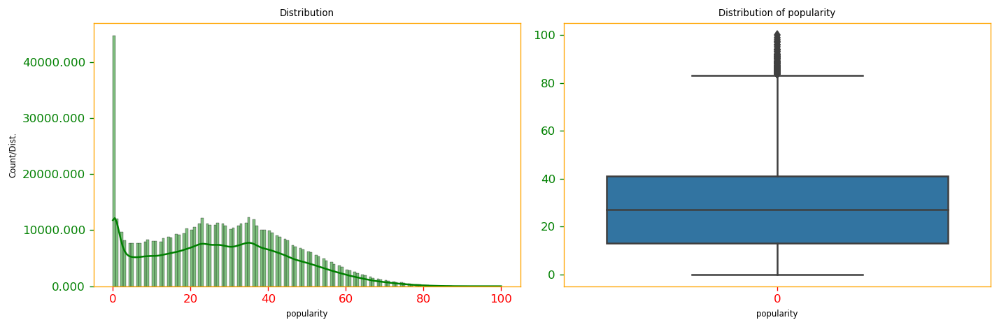

In [18]:
graph_histplot_boxplot(df, 'popularity')

Top 10 de las canciones más populares en el conjunto de datos

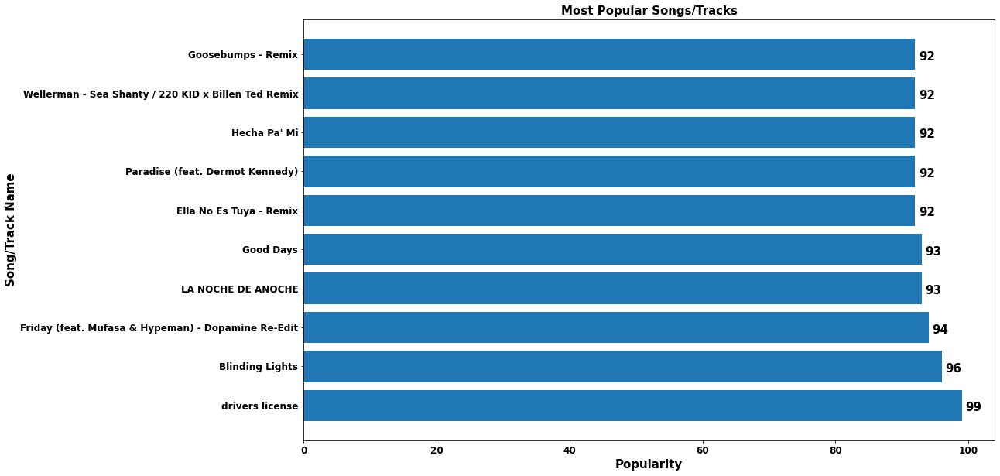

In [19]:
# Get top 10 most popular tracks
popular_songs = df.groupby('name')['popularity'].mean().sort_values(ascending=False).head(10)

# Plot horizontal bar chart
with plt.rc_context({'figure.facecolor':'white'}):
    plt.figure(figsize=(16, 10))
    plt.barh(popular_songs.index, popular_songs)
    plt.title('Most Popular Songs/Tracks', fontdict=dict(fontsize=15), fontweight='bold')
    plt.xlabel('Popularity', fontdict=dict(fontsize=15), fontweight='bold')
    plt.ylabel('Song/Track Name', fontdict=dict(fontsize=15), fontweight='bold')
    plt.xticks(fontsize='large', weight='bold')
    plt.yticks(fontsize='large', weight='bold')
    for i, v in enumerate(popular_songs):
        plt.text(v+0.5, i-0.15, str(int(v)), fontdict=dict(fontsize=15), fontweight='bold')
    plt.show()

In [20]:
get_frec_acum(df, 'popularity')

,Frec_abs,frec_abs_acum,frec_rel_%,frec_rel_%_acum
0,44690,44690,7.6175,7.6175
1,12024,56714,2.0495,9.6670
2,9639,66353,1.6430,11.3100
3,8154,74507,1.3899,12.6999
4,7733,82240,1.3181,14.0180
...,...,...,...,...
96,2,586667,0.0003,99.9991
97,2,586669,0.0003,99.9994
98,1,586670,0.0002,99.9996
99,1,586671,0.0002,99.9998


Vamos a crear un extracto del marco de datos principal (df2) con un valor categórico de `popularidad` (0 a 100) como bajo (<30) o alto (>70) y descartar todos los valores intermedios para que podamos generar un PairPlot para tener un panorama general de la relación entre la popularidad y todas las demás variables

In [21]:
def categorize(row):
    if row['popularity'] < 30:
        val = "low"
    else:
        val = "high"
    return val

# dropeo todos los valores medios para poder hacer el pairplot de nuevo con menos data y mas categorizada o agrupada
df2 = df.drop(df[(df.popularity > 30) & (df.popularity < 70)].index)
df2.drop(['duration_ms', 'mode', 'time_signature', 'explicit', 'key', 'mode'], axis=1, inplace=True)
df2['popularityCategorical'] = df2.apply(categorize, axis=1)
df2.drop(['popularity'], axis=1, inplace=True)
df2.describe().T

,count,mean,std,min,25%,50%,75%,max
danceability,337595.0,0.543155,0.165800,0.0,0.4300,0.556000,0.6660,0.991
energy,337595.0,0.489996,0.255308,0.0,0.2830,0.476000,0.6940,1.000
loudness,337595.0,-11.338780,5.238910,-60.0,-14.1550,-10.552000,-7.5010,5.376
speechiness,337595.0,0.108278,0.193489,0.0,0.0343,0.044000,0.0726,0.971
acousticness,337595.0,0.535791,0.355678,0.0,0.1730,0.597000,0.8770,0.996
instrumentalness,337595.0,0.149264,0.300646,0.0,0.0000,0.000087,0.0467,1.000
liveness,337595.0,0.218927,0.185604,0.0,0.1010,0.144000,0.2850,1.000
valence,337595.0,0.552799,0.262052,0.0,0.3430,0.568000,0.7740,1.000
tempo,337595.0,117.118500,29.755266,0.0,94.6380,115.976000,135.0160,246.381


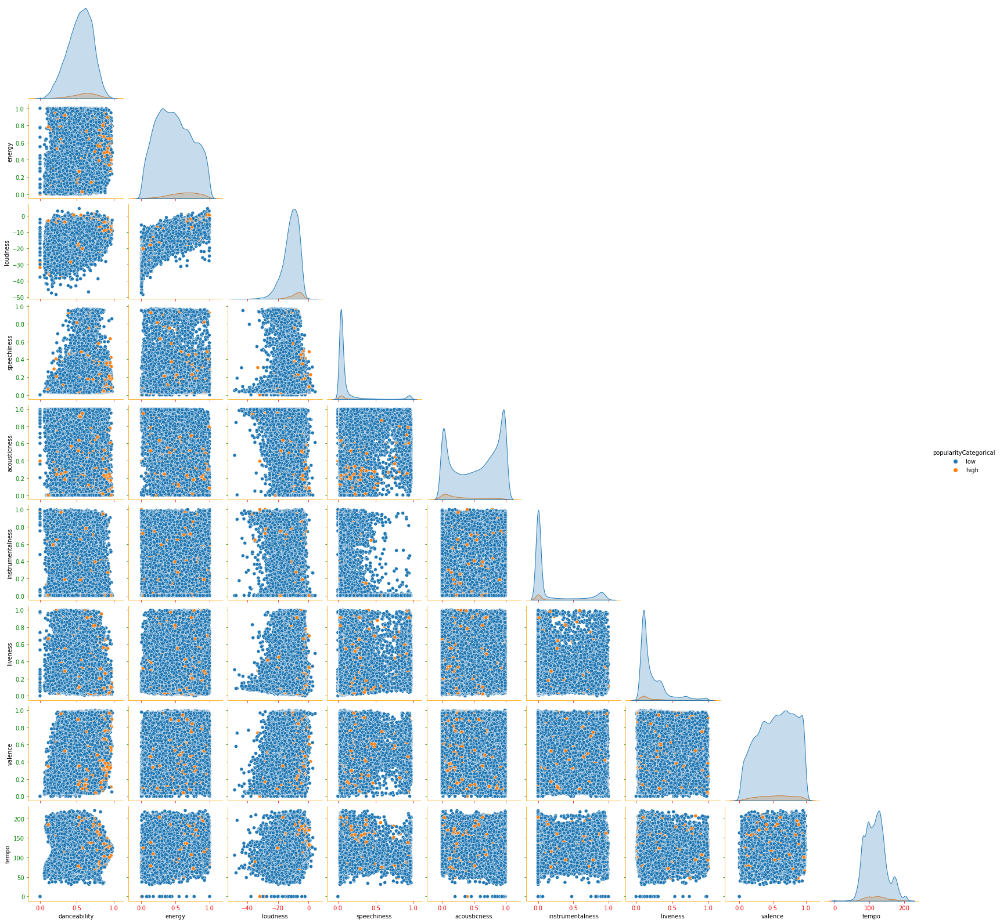

In [22]:
with plt.rc_context({'axes.edgecolor':'orange', 'xtick.color':'red', 'ytick.color':'green', 'figure.facecolor':'white'}):
    sns.pairplot(df2.sample(60000), hue = 'popularityCategorical', corner=True)
    plt.show()

Ahora, generaremos un gráfico de unión para que podamos observar qué tan positiva o negativa es la relación entre la "popularidad" y otras variables.

Joint plot de popularity con otras variables ==> 

Correlacion entre popularity y danceability ==>  0.1869997232129628


<Figure size 500x400 with 0 Axes>

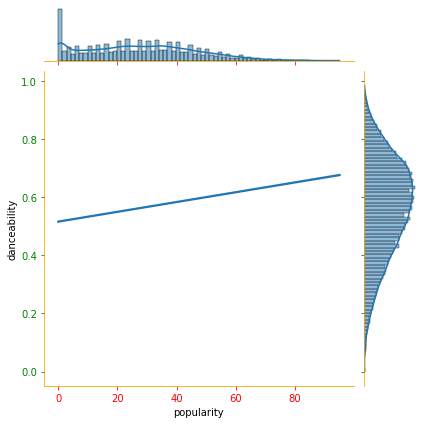

Correlacion entre popularity y energy ==>  0.3023152217928892


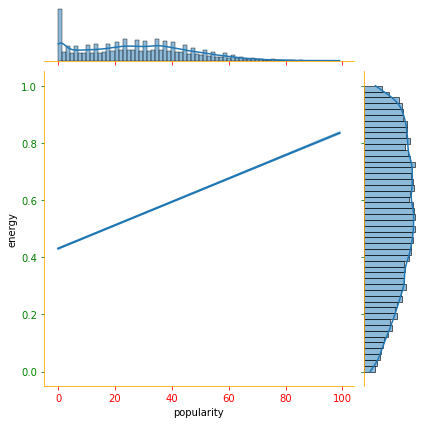

Correlacion entre popularity y loudness ==>  0.3270282258824504


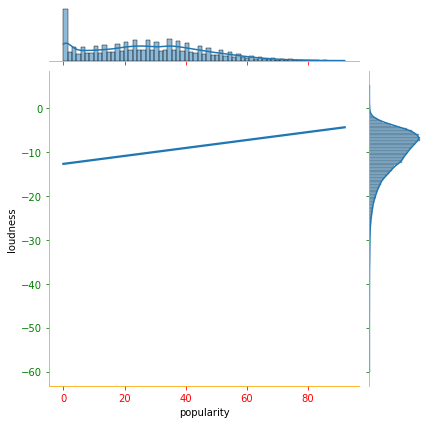

Correlacion entre popularity y speechiness ==>  -0.04735713748414268


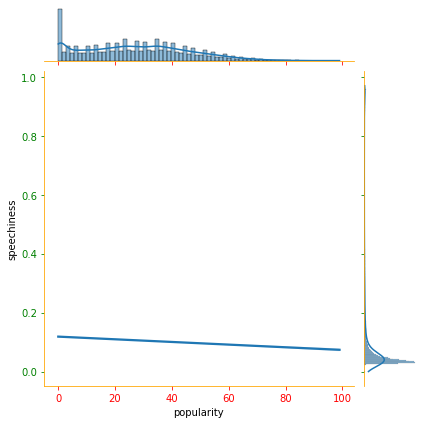

Correlacion entre popularity y acousticness ==>  -0.37088166120332444


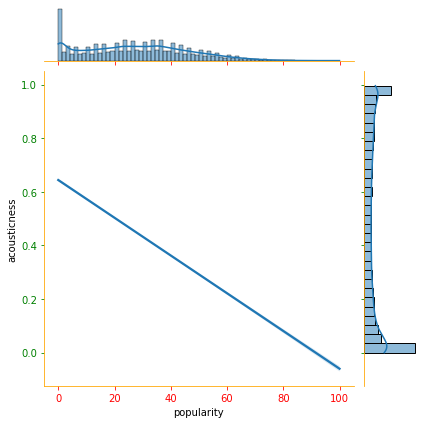

Correlacion entre popularity y instrumentalness ==>  -0.2364873145525719


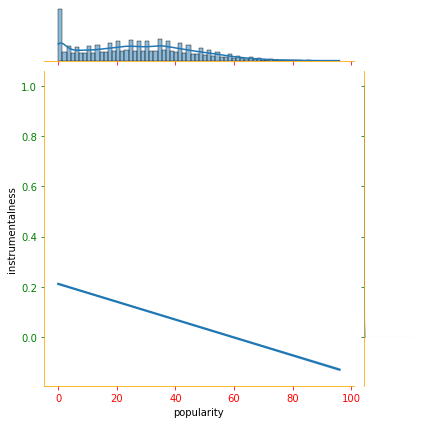

Correlacion entre popularity y liveness ==>  -0.04873992873066526


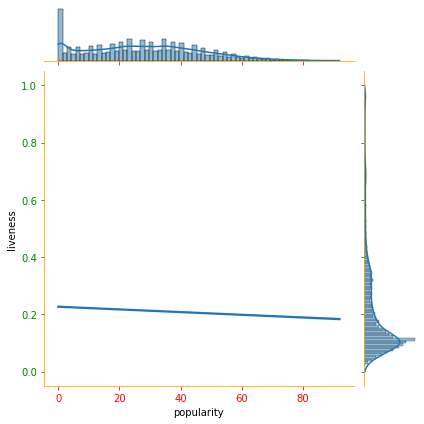

Correlacion entre popularity y valence ==>  0.004643291459072332


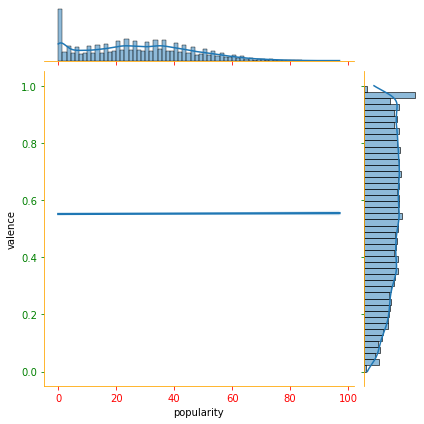

Correlacion entre popularity y tempo ==>  0.07136446416466032


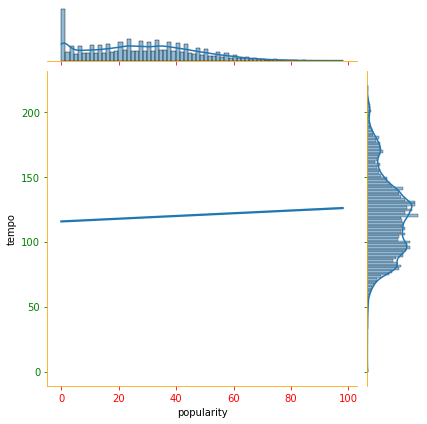

In [23]:
# Drop unnecesary columns
df3 = df.drop(['duration_ms', 'mode', 'time_signature', 'explicit', 'key', 'mode'], axis=1, inplace=False)

#JoinPlot de popularity vs las otras
with plt.rc_context({'axes.edgecolor':'orange', 'xtick.color':'red', 'ytick.color':'green', 'figure.facecolor':'white'}):
    sns.color_palette("Set2")
    plt.figure(dpi = 100, figsize = (5,4))
    print("Joint plot de popularity con otras variables ==> \n")
    for i in  df3.columns:
        if i != 'popularity' and i != 'id' and i != 'name' and i != 'artists' and i != 'id_artists' and i != 'release_date' and i != 'popularityCategorical':
            print(f"Correlacion entre popularity y {i} ==> ",df3.corr().loc['popularity'][i])
            g = sns.jointplot(x='popularity',y=i,data=df.sample(60000),kind = 'reg', scatter = False)
            plt.show()

Podemos ver que las 3 relaciones positivas más fuertes son con la bailabilidad, la energía y la sonoridad. Vamos a analizarlos

Análisis univariado para cada variable

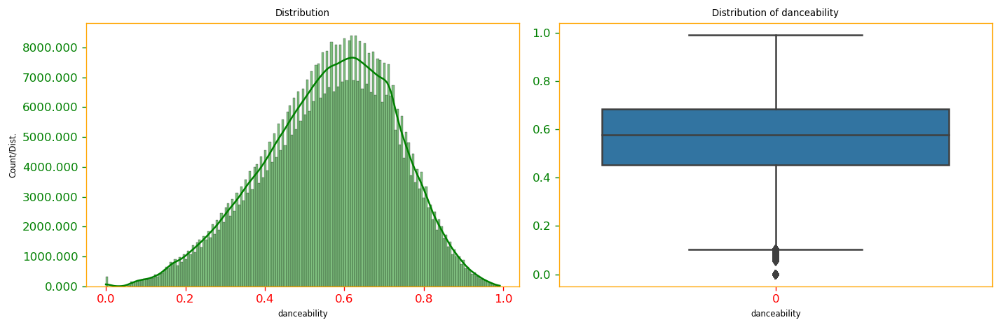

In [24]:
graph_histplot_boxplot(df, 'danceability')

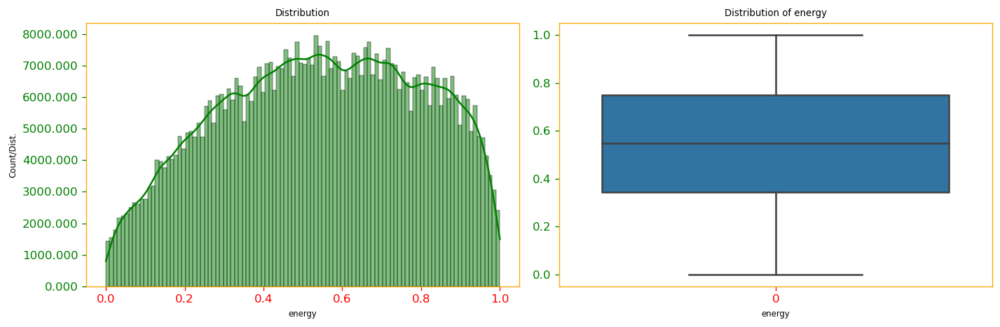

In [25]:
graph_histplot_boxplot(df, 'energy')

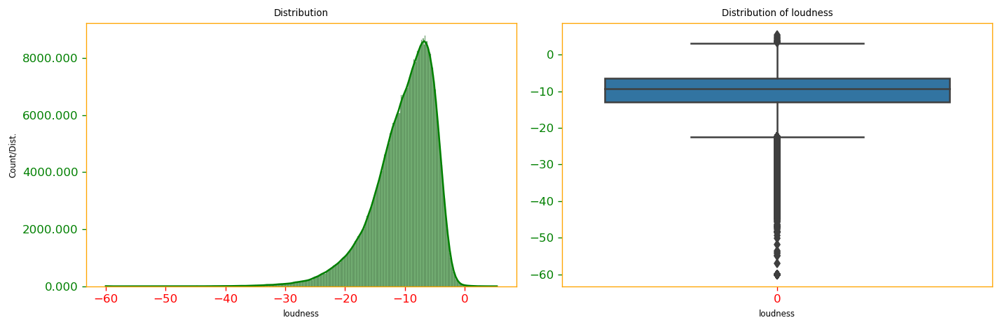

In [26]:
graph_histplot_boxplot(df, 'loudness')

Hagamos unos gráficos sobre la relación con la `popularidad`

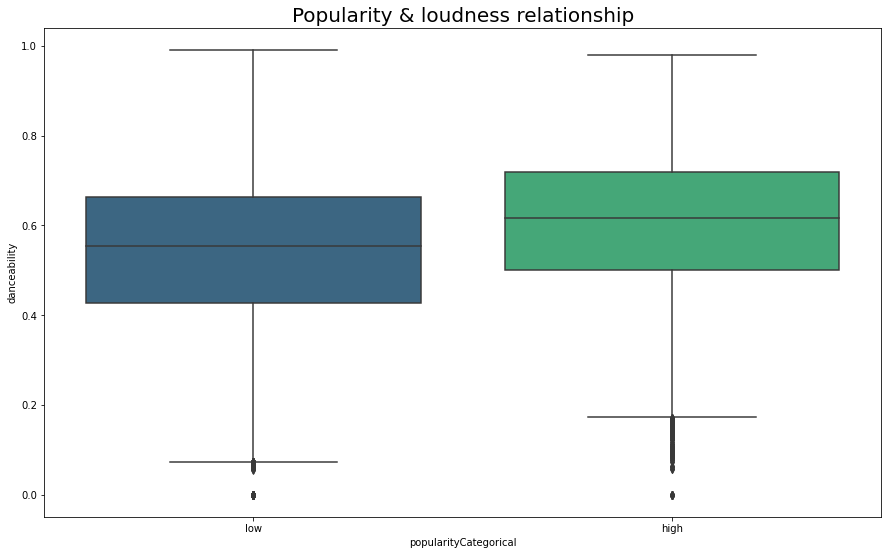

In [27]:
# Popularity vs Danceability
with plt.rc_context({'figure.facecolor':'white'}):
    plt.rcParams['figure.figsize'] = (15, 9)
    sns.boxplot(x='popularityCategorical', y='danceability', data=df2, palette = 'viridis')
    plt.title('Popularity & loudness relationship', fontsize = 20)
    plt.show()

Podemos ver que cuando la `popularidad` es alta, la canción tiende a ser más `bailable`

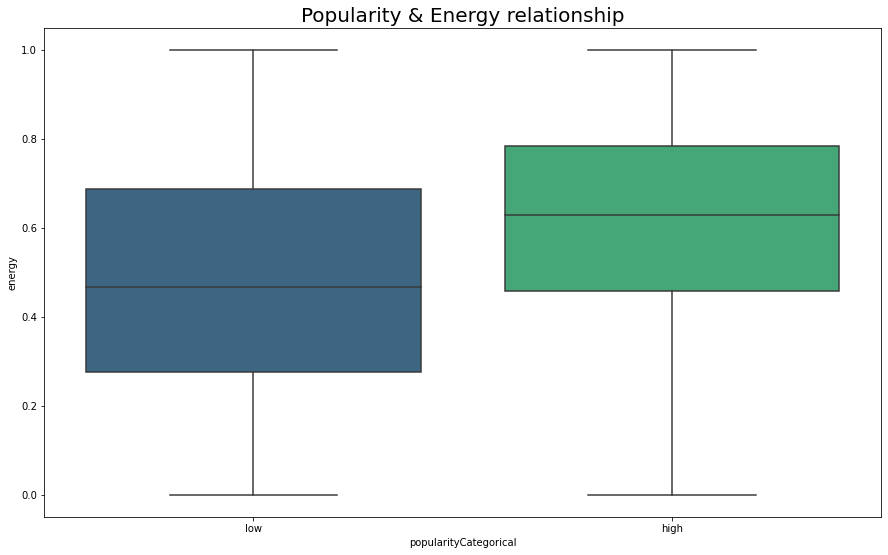

In [28]:
# Popularity vs Energy
with plt.rc_context({'figure.facecolor':'white'}):
    plt.rcParams['figure.figsize'] = (15, 9)
    sns.boxplot(x='popularityCategorical', y='energy', data=df2, palette = 'viridis')
    plt.title('Popularity & Energy relationship', fontsize = 20)
    plt.show()

Lo mismo para la energía. Podemos ver que cuando la popularidad es alta, la canción tiende a tener más energía, aquí encontramos que la relación positiva es más fuerte que la popularidad frente a la bailabilidad.

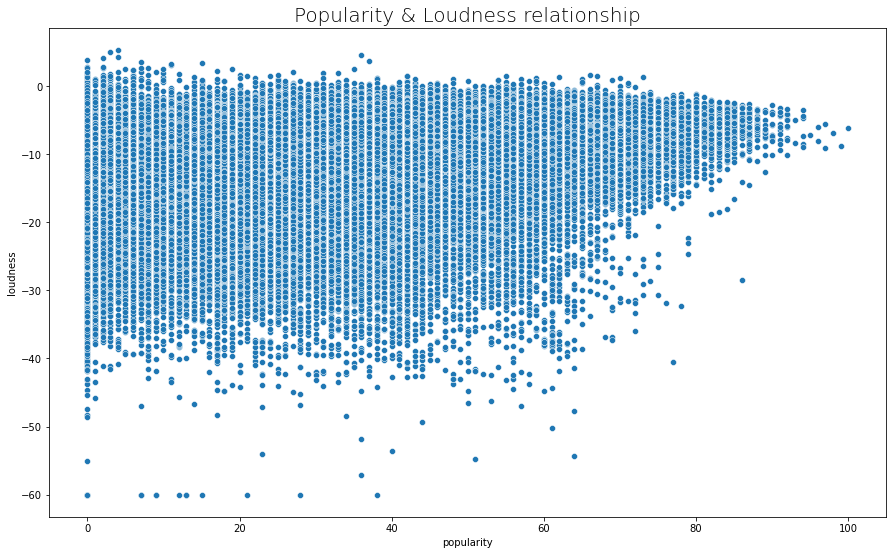

In [29]:
#Popularity vs Loudness
with plt.rc_context({'figure.facecolor':'white'}):
    plt.rcParams['figure.figsize'] = (15, 9)
    sns.scatterplot(x="popularity", y="loudness", data=df)
    plt.title('Popularity & Loudness relationship', fontsize = 20, fontweight = 30)

Y finalmente, usando un diagrama de dispersión, podemos ver que alcanzando una alta popularidad, el volumen tiende a aumentar a un rango entre 0 y -10

Durante este análisis, hemos creado 3 marcos de datos:
1. `df` es el completo
2. `df2` es un marco de datos filtrado, categorizado por popularidad y eliminamos todas las filas entre 30 < `popularidad` < 70 (más claro para un análisis sólido o dibujar gráficos pesados)
3. `df3` es lo mismo que `df` pero eliminamos todas las columnas innecesarias para crear gráficos

In [30]:
original_df = df
filtered_categorized_df = df2
filtered_df = df3

Usaremos el original_df para entrenar nuestro modelo de recomendación

#### Categorizamos, y spliteamos en 2 para entrenar modelos

In [31]:
from sklearn.model_selection import train_test_split

def categorize(row):
    if row['popularity'] < 33: #Median
        val = "low"
    else:
        val = "high"
    return val

df_new = numerical_df.copy()
df_new['popularityCategorical'] = df_new.apply(categorize, axis=1)
df_new = df_new.drop(df_new[(df_new.popularity < 10) | (df_new.popularity > 90)].index)
print('Median: ', df_new['popularity'].median())
print('Mode: ', df_new['popularity'].mode())

df_new = df_new.sample(frac =.01)
df_new_categorical = df_new.drop(['popularity'], axis=1)
X = df_new_categorical.drop("popularityCategorical", axis=1)
y = df_new_categorical.popularityCategorical

#Train y Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

df_new_categorical

Median:  33.0
Mode:  0    35
dtype: int64


,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,popularityCategorical
51694,0.567,0.513,-13.422,0.1240,0.15700,0.000047,0.0569,0.5570,111.359,high
96400,0.626,0.171,-19.159,0.0446,0.79300,0.000266,0.1890,0.8420,100.383,low
475359,0.561,0.840,-4.877,0.0599,0.49000,0.000000,0.1140,0.5870,145.054,high
202445,0.105,0.160,-18.962,0.0356,0.91000,0.945000,0.1010,0.0351,91.393,low
575053,0.527,0.919,-3.906,0.0583,0.00395,0.000002,0.3430,0.6320,139.011,high
...,...,...,...,...,...,...,...,...,...,...
171331,0.716,0.948,-5.747,0.0313,0.24000,0.000127,0.0772,0.8660,130.001,low
38012,0.755,0.433,-10.300,0.0438,0.25500,0.006940,0.2300,0.8320,115.044,low
451794,0.474,0.553,-9.736,0.0293,0.78700,0.000000,0.2690,0.7350,75.087,low
70224,0.621,0.679,-7.961,0.0475,0.06320,0.000497,0.9880,0.1850,109.413,high


#### Probamos Random Forest

In [32]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
#Creamos un arbol de decisión sencillo y lo fiteamos
tree = DecisionTreeClassifier(random_state=11)
tree.fit(X_train, y_train)

DecisionTreeClassifier(random_state=11)

In [33]:
y_test_pred = tree.predict(X_test) #Prediccion en Test

In [34]:
from sklearn.metrics import accuracy_score

#Calculo el accuracy en Test
test_accuracy = accuracy_score(y_test, y_test_pred)

print('% de aciertos sobre el set de evaluación:',test_accuracy)

% de aciertos sobre el set de evaluación: 0.5602150537634408


In [35]:
#Creamos un random forest!
model = RandomForestClassifier(random_state=11, n_estimators=1000,
                               class_weight="balanced", max_features="log2")
model.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', max_features='log2',
                       n_estimators=1000, random_state=11)

In [36]:
y_test_pred = model.predict(X_test) #Prediccion en Test

In [37]:
#Calculo el accuracy en Test
test_accuracy = accuracy_score(y_test, y_test_pred)

print('% de aciertos sobre el set de evaluación:',test_accuracy)

% de aciertos sobre el set de evaluación: 0.6311827956989248


#### Probamos Regresión logística

In [38]:
#Entrenamos un modelo de regresión logística

# Paso 3: importamos la clase LogisticRegresion de scikit-learn
from sklearn.linear_model import LogisticRegression

# Paso 4: Creamos una instancia de la Regresión Logística
regresion_logistica = LogisticRegression()

# Paso 5: Entrenamos la regresión logística con los datos de entrenamiento
regresion_logistica.fit(X,y)

LogisticRegression()

In [39]:
probabilidades_prediccion = regresion_logistica.predict(X_test)
#Calculo el accuracy en Test
test_accuracy = accuracy_score(y_test, probabilidades_prediccion)
print('% de aciertos sobre el set de evaluación:',test_accuracy)

% de aciertos sobre el set de evaluación: 0.6290322580645161


#### Probamos KNeighborsClassifier

In [40]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=2)
knn.fit(X,y.values.ravel())

KNeighborsClassifier(n_neighbors=2)

In [41]:
prediction = knn.predict(X_test)
#Calculo el accuracy en Test
test_accuracy = accuracy_score(y_test, prediction)
print('% de aciertos sobre el set de evaluación:',test_accuracy)

% de aciertos sobre el set de evaluación: 0.7548387096774194


#### Probamos SVC

In [42]:
from sklearn.svm import SVC, SVR
estimador_svm = SVC()
estimador_svm.fit(X_train, y_train)


SVC()

In [43]:
y_test_pred2 = estimador_svm.predict(X_test)
#Calculo el accuracy en Test
test_accuracy = accuracy_score(y_test, y_test_pred2)
print('% de aciertos sobre el set de evaluación:',test_accuracy)

% de aciertos sobre el set de evaluación: 0.6096774193548387


### Nos quedamos con el KNeighborsClassifier por tener 0.78 de exactitud

Ahora aplicaremos 2 modelos de regresion para poder predecir el valor final de la popularity que puede llegar a tener una canción

In [44]:
df_new

,popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,popularityCategorical
51694,53,0.567,0.513,-13.422,0.1240,0.15700,0.000047,0.0569,0.5570,111.359,high
96400,15,0.626,0.171,-19.159,0.0446,0.79300,0.000266,0.1890,0.8420,100.383,low
475359,36,0.561,0.840,-4.877,0.0599,0.49000,0.000000,0.1140,0.5870,145.054,high
202445,12,0.105,0.160,-18.962,0.0356,0.91000,0.945000,0.1010,0.0351,91.393,low
575053,48,0.527,0.919,-3.906,0.0583,0.00395,0.000002,0.3430,0.6320,139.011,high
...,...,...,...,...,...,...,...,...,...,...,...
171331,15,0.716,0.948,-5.747,0.0313,0.24000,0.000127,0.0772,0.8660,130.001,low
38012,32,0.755,0.433,-10.300,0.0438,0.25500,0.006940,0.2300,0.8320,115.044,low
451794,11,0.474,0.553,-9.736,0.0293,0.78700,0.000000,0.2690,0.7350,75.087,low
70224,49,0.621,0.679,-7.961,0.0475,0.06320,0.000497,0.9880,0.1850,109.413,high


In [45]:
df_low  = df_new[df_new['popularityCategorical']=='low']
df_high  = df_new[df_new['popularityCategorical']=='high']

In [46]:
df_low

,popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,popularityCategorical
96400,15,0.626,0.171,-19.159,0.0446,0.7930,0.000266,0.1890,0.8420,100.383,low
202445,12,0.105,0.160,-18.962,0.0356,0.9100,0.945000,0.1010,0.0351,91.393,low
469074,27,0.420,0.950,-8.920,0.0576,0.0184,0.059100,0.2110,0.5020,124.612,low
477144,30,0.617,0.823,-8.517,0.0377,0.0961,0.000000,0.1780,0.5860,102.233,low
577303,18,0.655,0.489,-9.163,0.1360,0.9520,0.000000,0.6990,0.8810,100.349,low
...,...,...,...,...,...,...,...,...,...,...,...
34333,20,0.541,0.357,-11.293,0.0308,0.6980,0.195000,0.1050,0.5140,100.482,low
572208,16,0.644,0.455,-11.606,0.0257,0.6220,0.000000,0.0708,0.3890,130.002,low
171331,15,0.716,0.948,-5.747,0.0313,0.2400,0.000127,0.0772,0.8660,130.001,low
38012,32,0.755,0.433,-10.300,0.0438,0.2550,0.006940,0.2300,0.8320,115.044,low


In [47]:
df_high

,popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,popularityCategorical
51694,53,0.567,0.513,-13.422,0.1240,0.157000,0.000047,0.0569,0.557,111.359,high
475359,36,0.561,0.840,-4.877,0.0599,0.490000,0.000000,0.1140,0.587,145.054,high
575053,48,0.527,0.919,-3.906,0.0583,0.003950,0.000002,0.3430,0.632,139.011,high
64732,55,0.335,0.337,-14.372,0.0418,0.760000,0.000000,0.0472,0.300,169.635,high
536453,40,0.726,0.675,-7.363,0.0450,0.273000,0.000000,0.0679,0.951,160.961,high
...,...,...,...,...,...,...,...,...,...,...,...
370173,49,0.868,0.802,-4.696,0.0572,0.005150,0.000003,0.4170,0.672,120.013,high
582888,50,0.629,0.870,-4.848,0.0298,0.295000,0.000028,0.2660,0.618,131.995,high
303539,73,0.365,0.751,-5.429,0.3040,0.000707,0.000000,0.3180,0.604,79.119,high
70224,49,0.621,0.679,-7.961,0.0475,0.063200,0.000497,0.9880,0.185,109.413,high


### Dropeamos las columnas de popularity y predecimos con regresion

In [48]:
#Regresion Lineal
from sklearn.model_selection import train_test_split

X = df_high.drop(["popularity", "popularityCategorical"], axis=1)
y = df_high.popularity

#Train y Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [49]:
#Importamos, creamos y fiteamos el modelo
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

linear_model = make_pipeline(StandardScaler(with_mean=False), LinearRegression())
regressor = LinearRegression()

#Creamos el modelo
linear_model.fit(X_train, y_train)
regressor.fit(X_train, y_train)

LinearRegression()

In [50]:
print('Training score: ', linear_model.score(X_train, y_train))
print('Training score: ', regressor.score(X_train, y_train))

Training score:  0.07009285937404619
Training score:  0.07009285937404619


In [51]:
#Realizamos las predicciones
y_pred = linear_model.predict(X_test)

In [52]:
df_predicted = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
df_predicted.sort_values(by='Predicted', ascending=True)

,Actual,Predicted
158271,63,32.044726
242831,40,36.054374
485902,33,37.453338
99517,35,37.753895
193868,35,38.150018
...,...,...
295340,35,51.782521
456677,53,51.920904
311538,39,52.347675
358397,42,52.523429


In [53]:
from sklearn.metrics import r2_score
print('Puntaje Testing', r2_score(y_test, y_pred))

Puntaje Testing 0.026472746261768987


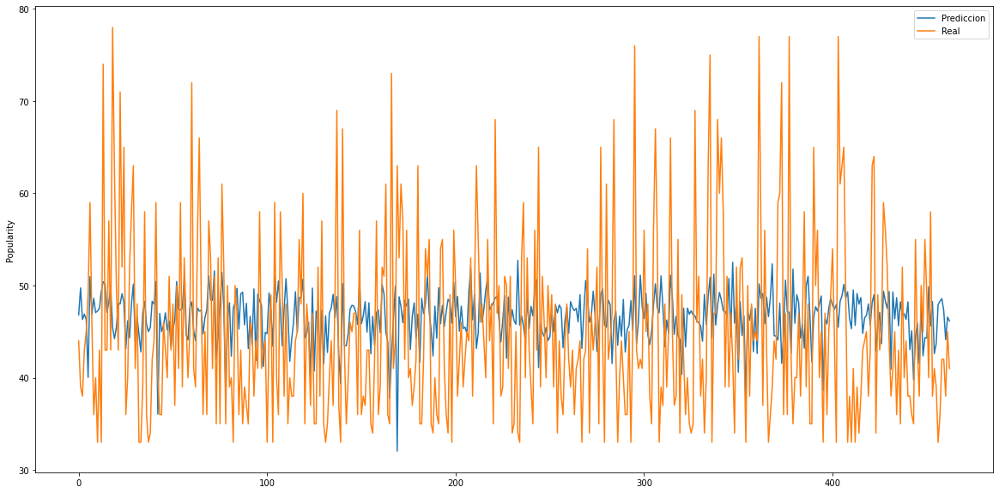

In [54]:
#Ploteamos
plt.figure(figsize = (20,10))

plt.plot(y_pred, label='Prediccion')
plt.plot(y_test.values, label='Real')

plt.ylabel('Popularity')

plt.legend()
plt.show()

In [55]:
#Evaluación de Modelos
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

Mean Absolute Error: 7.730022972163135
Mean Squared Error: 92.38499294290865
Root Mean Squared Error: 9.611711239051486


In [56]:
# Las saque de la API de spotify - https://developer.spotify.com/console/get-audio-features-track/?id=4Dvkj6JhhA12EX05fT7y2e - https://developer.spotify.com/console/get-track/?id=7kYbxvrGXv8cmKjkqgqhrw&market=

tini_song = {
    "name": "triple T",
    "popularity": 84,
  "danceability": 0.801,
  "energy": 0.633,
  "loudness": -2.785,
  "speechiness": 0.0777,
  "acousticness": 0.414,
  "instrumentalness": 0,
  "liveness": 0.27,
  "valence": 0.676,
  "tempo": 92.025
}

harry_stile_song = {
    "name": "As It Was",
  "popularity": 94,
    "danceability": 0.52,
  "energy": 0.731,
  "loudness": -5.338,
  "speechiness": 0.0557,
  "acousticness": 0.342,
  "instrumentalness": 0.00101,
  "liveness": 0.311,
  "valence": 0.662,
  "tempo": 173.93,
}

Kate_song = {
    "name": "Running Up That Hill (A Deal With God)",
  "popularity": 97,
  "danceability": 0.629,
  "energy": 0.547,
  "loudness": -13.123,
  "speechiness": 0.055,
  "acousticness": 0.72,
  "instrumentalness": 0.00314,
  "liveness": 0.0604,
  "valence": 0.197,
  "tempo": 108.375,
}


tini_song = [0.801, 0.633, -2.785, 0.0777, 0.414, 0, 0.27, 0.676, 92.025]
harry_song = [0.52, 0.731, -5.338, 0.0557, 0.342, 0.00101, 0.311, 0.662, 173.93]
kate_song = [0.629, 0.547, -13.123, 0.055, 0.72, 0.00314, 0.0604, 0.197, 108.375]

# initialize list of lists
data = [tini_song, harry_song, kate_song]
  
# Create the pandas DataFrame
df_songs_to_predict = pd.DataFrame(data, columns=X_test.columns)
  
# print dataframe.
df_songs_to_predict

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,0.801,0.633,-2.785,0.0777,0.414,0.00000,0.2700,0.676,92.025
1,0.520,0.731,-5.338,0.0557,0.342,0.00101,0.3110,0.662,173.930
2,0.629,0.547,-13.123,0.0550,0.720,0.00314,0.0604,0.197,108.375


In [57]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.metrics import mean_squared_error

In [58]:
modelo_RF = RandomForestRegressor(
    n_estimators = 100,
         )
modelo_RF.fit(X_train, y_train)

RandomForestRegressor()

In [59]:
# Error de test del modelo inicial
# ==============================================================================
y_pred_RF = modelo_RF.predict(X = X_test)

rmse = mean_squared_error(
        y_true  = y_test,
        y_pred  = y_pred_RF,
        squared = False
       )
print(f"El error (rmse) de test es: {rmse}")

El error (rmse) de test es: 9.953294070355398


In [60]:
#Evaluación de Modelos
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_RF))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_RF))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_RF)))

Mean Absolute Error: 8.103261339092871
Mean Squared Error: 99.06806285097191
Root Mean Squared Error: 9.953294070355398


In [61]:
y_pred_RF = modelo_RF.predict(df_songs_to_predict)

# Valores reales 84, 94, 97
y_pred_RF

array([56.76, 50.48, 46.24])

In [62]:
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

In [63]:
modelo_SVR = SVR(
            kernel='rbf',
            
         )
modelo_SVR.fit(X_train, y_train)

SVR()

In [64]:
y_pred_SVR = modelo_SVR.predict(X = X_test)

In [65]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_SVR))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_SVR))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_SVR)))

Mean Absolute Error: 7.398785258907825
Mean Squared Error: 94.14355365337808
Root Mean Squared Error: 9.702760104907163


In [66]:
df_predicted_SVR = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred_SVR})
df_predicted_SVR.sort_values(by='Predicted', ascending=True)
df_predicted_SVR

,Actual,Predicted
332697,44,44.915319
200369,39,44.479044
188368,38,44.898013
478909,43,44.730370
569590,45,44.672262
...,...,...
295664,42,43.872455
332088,42,43.880856
225820,38,43.801172
461940,45,44.118795


In [67]:
print('Puntaje Testing', r2_score(y_test, y_pred_SVR))

Puntaje Testing 0.007941524637351871


In [68]:
y_df_songs_to_predict_SVR = modelo_SVR.predict(df_songs_to_predict)
y_df_songs_to_predict_SVR

array([44.45365346, 44.25975568, 43.75952561])

#### No funciona nada de nuevo, vamos a duplicar las variables de popularityCategorical para entrenar 4 algoritmos de regresion según el caso

Usaremos el boxplot de popularity en el analisis de univariado para poder definir los cortes del dataset

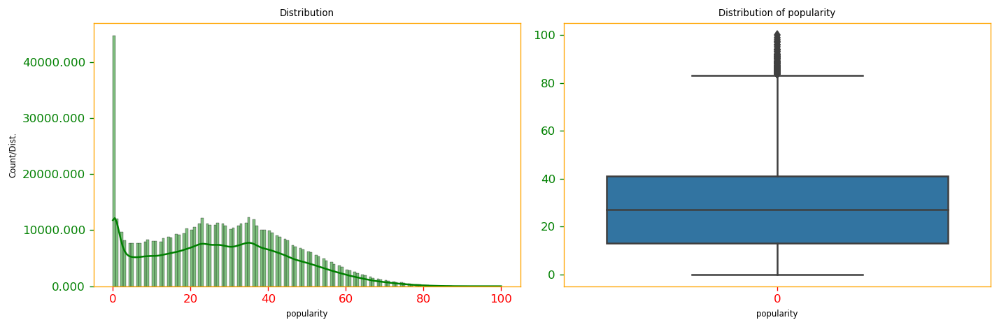

In [69]:
graph_histplot_boxplot(df, 'popularity')

In [70]:
from sklearn.model_selection import train_test_split

def categorize(row):
    if row['popularity'] < 12:
        val = "low"
    elif row['popularity'] < 35:
        val = "medium"
    elif row['popularity'] < 82:
        val = "high"
    else:
        val = "superHigh"
    return val

df_new_4 = numerical_df.copy()
df_new_4['popularityCategorical'] = df_new_4.apply(categorize, axis=1)
df_new_4 = df_new_4.drop(df_new_4[(df_new_4.popularity < 1)].index)

df_new_4 = df_new_4.sample(frac =.2)
df_new_categorical_4 = df_new_4.drop(['popularity'], axis=1)
X = df_new_categorical_4.drop("popularityCategorical", axis=1)
y = df_new_categorical_4.popularityCategorical

#Train y Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

## Canciones a predecir obtenidas desde la API de Spotify con valoraciones reales de usuarios

In [71]:
# GET https://api.spotify.com/v1/tracks/{id} - Popularity + name
# GET https://api.spotify.com/v1/audio-features/{id} - features

tini_song = [0.801, 0.633, -2.785, 0.0777, 0.414, 0, 0.27, 0.676, 92.025] # "Triple T" tinee popularity 84
Calvis_song = [0.791, 0.862, -3.24, 0.11, 0.037, 0.0000219, 0.0814, 0.592, 123.994] # "As it was" tinee popularity 94
Becerra_song = [0.796, 0.7666, -4.2377, 0.0422, 0.18, 0.00000153, 0.164, 0.846, 121.008] # "Berlín" tinee popularity 79
Shakira_song = [0.695, 0.636, -4.654, 0.317, 0.234, 0, 0.081, 0.575, 174.14] # "Te felicito" tinee popularity 94
electro_song = [0.666, 0.722, -7.62, 0.029, 0.0449, 0.0514, 0.0884, 0.609, 108.018] # "Touch - Poolside Remix" tinee popularity 49
Septeto_acarey_song = [0.621,0.79,-5.42, 0.0343, 0.246,0.0000297,0.182,0.92,169.914] #"Tu eres mi sueño" tiene popularity 0 :(
pepas_song = [0.621,0.79,-5.42, 0.0343, 0.246,0.0000297,0.182,0.92,169.914] #"Pepas RKT - Remix" tiene popularity 51
wowwow_song = [0.744,0.679,-3.51, 0.0791, 0.0654,0.00429,0.0966,0.866,176.024] #"Wow Wow (feat. Becky G)" tiene popularity 64
Goyte_song = [0.649,0.264,-18.15, 0.0343, 0.955,0.0748,0.107,0.708,115.898] #"Bronte" tiene popularity 33

# initialize list of lists
data = [Calvis_song, Shakira_song, electro_song,  pepas_song, Goyte_song, Septeto_acarey_song]
# 94 - 94 - 49 - 51 - 33 - 0
#Deberia ser superHigh, superHigh, high, high, low, 0
  
# Create the pandas DataFrame
df_songs_to_predict = pd.DataFrame(data, columns=X_test.columns)
df_songs_to_predict_superHigh = pd.DataFrame([Calvis_song, Shakira_song], columns=X_test.columns)
df_songs_to_predict_high = pd.DataFrame([electro_song,  pepas_song], columns=X_test.columns)
df_songs_to_predict_medium = pd.DataFrame([Goyte_song], columns=X_test.columns)
df_songs_to_predict_septetoAcarey = pd.DataFrame([Septeto_acarey_song], columns=X_test.columns)
  
# print dataframe.
df_songs_to_predict


,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,0.791,0.862,-3.240,0.1100,0.0370,0.000022,0.0814,0.592,123.994
1,0.695,0.636,-4.654,0.3170,0.2340,0.000000,0.0810,0.575,174.140
2,0.666,0.722,-7.620,0.0290,0.0449,0.051400,0.0884,0.609,108.018
3,0.621,0.790,-5.420,0.0343,0.2460,0.000030,0.1820,0.920,169.914
4,0.649,0.264,-18.150,0.0343,0.9550,0.074800,0.1070,0.708,115.898
5,0.621,0.790,-5.420,0.0343,0.2460,0.000030,0.1820,0.920,169.914


In [72]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

knn = KNeighborsClassifier(n_neighbors=100, weights="distance")
knn.fit(X_train, y_train.values.ravel()) #y.values.ravel()
prediction = knn.predict(X_test)
#Calculo el accuracy en Test
test_accuracy = accuracy_score(y_test, prediction)
print('% de aciertos sobre el set de evaluación:',test_accuracy)

% de aciertos sobre el set de evaluación: 0.5167435424354243


In [73]:
prediction = knn.predict(df_songs_to_predict)
prediction
# 94 - 94 - 49 - 51 - 33 - 0
#Deberia ser superHigh, superHigh, high, high, low, 0

array(['superHigh', 'high', 'medium', 'high', 'medium', 'high'],
      dtype=object)

septetoAcarey song me da que es in high

In [74]:
from sklearn.tree import DecisionTreeClassifier
tree_model = DecisionTreeClassifier(max_depth=5, ccp_alpha=0.01, criterion='gini')
tree_model.fit(X_train, y_train)
print(tree_model.score(X_test, y_test))

0.509409594095941


In [75]:
from sklearn.metrics import accuracy_score

y_test_pred = model.predict(X_test) #Prediccion en Test
#Calculo el accuracy en Test
test_accuracy = accuracy_score(y_test, y_test_pred)

print('% de aciertos sobre el set de evaluación:',test_accuracy)
# 94 - 94 - 49 - 51 - 33 - 0
#Deberia ser superHigh, superHigh, high, high, low, 0

% de aciertos sobre el set de evaluación: 0.38330258302583026


#### Probamos RF

In [76]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
#Creamos un arbol de decisión sencillo y lo fiteamos
#Creamos un random forest!
model = RandomForestClassifier(random_state=11, n_estimators=100,
                               class_weight="balanced")
model.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', random_state=11)

In [77]:
from sklearn.metrics import accuracy_score

y_test_pred = model.predict(X_test) #Prediccion en Test
#Calculo el accuracy en Test
test_accuracy = accuracy_score(y_test, y_test_pred)

print('% de aciertos sobre el set de evaluación:',test_accuracy)

% de aciertos sobre el set de evaluación: 0.5556273062730628


In [78]:
prediction = model.predict(df_songs_to_predict)
prediction
# 94 - 94 - 49 - 51 - 33 - 0
#Deberia ser superHigh, superHigh, high, high, low, 0

array(['superHigh', 'high', 'medium', 'high', 'medium', 'high'],
      dtype=object)

In [79]:
df_low  = df_new_4[df_new_4['popularityCategorical']=='low']
df_medium  = df_new_4[df_new_4['popularityCategorical']=='medium']
df_high  = df_new_4[df_new_4['popularityCategorical']=='high']
df_superHigh  = df_new_4[df_new_4['popularityCategorical']=='superHigh']

### Predecimos los superHigh

In [80]:
df_superHigh#.head(10)

,popularity,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,popularityCategorical
89920,84,0.617,0.6350,-6.769,0.0317,0.049800,0.000014,0.1640,0.446,103.019,superHigh
93893,84,0.509,0.2280,-8.680,0.0332,0.920000,0.000000,0.1040,0.586,90.674,superHigh
93079,83,0.652,0.6310,-5.718,0.0893,0.524000,0.000579,0.1650,0.350,127.998,superHigh
93856,87,0.542,0.7320,-5.956,0.0521,0.002090,0.000079,0.4960,0.489,124.912,superHigh
91965,82,0.561,0.0848,-15.099,0.0404,0.913000,0.000026,0.1120,0.206,102.128,superHigh
...,...,...,...,...,...,...,...,...,...,...,...
93895,84,0.716,0.5130,-10.159,0.2230,0.085000,0.000000,0.1200,0.800,141.894,superHigh
85062,82,0.707,0.9240,-2.842,0.0310,0.000972,0.007030,0.2040,0.919,127.937,superHigh
93139,82,0.695,0.8840,-2.278,0.0753,0.056100,0.000000,0.2130,0.914,103.014,superHigh
93905,83,0.670,0.6930,-8.340,0.3500,0.200000,0.000000,0.0909,0.388,87.017,superHigh


In [81]:
from sklearn.model_selection import train_test_split

X = df_superHigh.drop(["popularity", "popularityCategorical"], axis=1)
y = df_superHigh.popularity

#Train y Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [82]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.metrics import mean_squared_error

modelo_RF = RandomForestRegressor()
modelo_RF.fit(X_train, y_train)

RandomForestRegressor()

In [83]:
from sklearn import metrics
y_pred_RF = modelo_RF.predict(X = X_test)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_RF))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_RF))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_RF)))

Mean Absolute Error: 2.5419696969696988
Mean Squared Error: 15.01219652777778
Root Mean Squared Error: 3.87455759123255


In [84]:
y_pred_RF = modelo_RF.predict(df_songs_to_predict_superHigh)
y_pred_RF
# 94 - 94

array([84.02083333, 84.63833333])

### Predecimos un high

In [85]:
X = df_high.drop(["popularity", "popularityCategorical"], axis=1)
y = df_high.popularity

#Train y Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [86]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.metrics import mean_squared_error
modelo_RF = RandomForestRegressor()
modelo_RF.fit(X_train, y_train)

RandomForestRegressor()

In [87]:
from sklearn import metrics
y_pred_RF = modelo_RF.predict(X = X_test)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_RF))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_RF))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_RF)))

Mean Absolute Error: 7.478293439491523
Mean Squared Error: 86.2447409079755
Root Mean Squared Error: 9.286804666190385


In [88]:
y_pred_RF = modelo_RF.predict(df_songs_to_predict_high)
y_pred_RF
# 49 - 51
#Deberia ser superHigh, superHigh, high, high, low, 0

array([46.53, 49.07])

In [89]:
y_pred_RF = modelo_RF.predict(df_songs_to_predict_septetoAcarey)
y_pred_RF

array([49.07])

### Predecimos un low

In [90]:
X = df_medium.drop(["popularity", "popularityCategorical"], axis=1)
y = df_medium.popularity

#Train y Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [91]:
modelo_RF_medium = RandomForestRegressor()
modelo_RF_medium.fit(X_train, y_train)

RandomForestRegressor()

In [92]:
from sklearn import metrics
y_pred_RF_medium = modelo_RF_medium.predict(X = X_test)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_RF_medium))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_RF_medium))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_RF_medium)))

Mean Absolute Error: 5.363005679611128
Mean Squared Error: 40.3007543315397
Root Mean Squared Error: 6.3482875117262685


In [93]:
y_pred_RF_medium = modelo_RF_medium.predict(df_songs_to_predict_medium)
y_pred_RF_medium
# 33

array([20.98])

# Número de árboles


En Random Forest, el número de árboles no es un hiperparámetro crítico en cuanto que, añadir árboles, solo puede hacer que mejorar el resultado. 
En Random Forest no se produce overfitting por exceso de árboles. 
Sin embargo, añadir árboles una vez que la mejora se estabiliza es una perdida te recursos computacionales.

Valor óptimo de n_estimators: 146


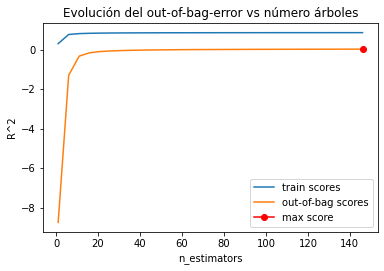

In [94]:
# Validación empleando el Out-of-Bag error
# ==============================================================================
train_scores = []
oob_scores   = []

# Valores evaluados
estimator_range = range(1, 150, 5)

# Bucle para entrenar un modelo con cada valor de n_estimators y extraer su error
# de entrenamiento y de Out-of-Bag.
for n_estimators in estimator_range:
    modelo = RandomForestRegressor(
                n_estimators = n_estimators,
                criterion    = 'mse',
                max_depth    = None,
                max_features = 'auto',
                oob_score    = True,
                n_jobs       = -1,
                random_state = 123
             )
    modelo.fit(X_train, y_train)
    train_scores.append(modelo.score(X_train, y_train))
    oob_scores.append(modelo.oob_score_)
    
# Gráfico con la evolución de los errores
fig, ax = plt.subplots(figsize=(6, 3.84))
ax.plot(estimator_range, train_scores, label="train scores")
ax.plot(estimator_range, oob_scores, label="out-of-bag scores")
ax.plot(estimator_range[np.argmax(oob_scores)], max(oob_scores),
        marker='o', color = "red", label="max score")
ax.set_ylabel("R^2")
ax.set_xlabel("n_estimators")
ax.set_title("Evolución del out-of-bag-error vs número árboles")
plt.legend();
print(f"Valor óptimo de n_estimators: {estimator_range[np.argmax(oob_scores)]}")

# Max features

El valor de máx_features es uno de los hiperparámetros más importantes de random forest, ya que es el que permite controlar cuánto se decorrelacionan los árboles entre sí.

Valor óptimo de max_features: 1


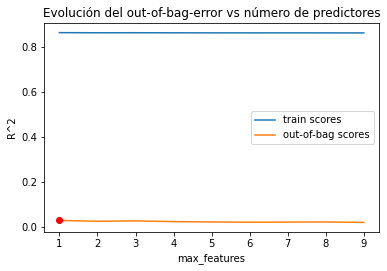

In [95]:
# Validación empleando el Out-of-Bag error
# ==============================================================================
train_scores = []
oob_scores   = []

# Valores evaluados
max_features_range = range(1, X_train.shape[1] + 1, 1)

# Bucle para entrenar un modelo con cada valor de max_features y extraer su error
# de entrenamiento y de Out-of-Bag.
for max_features in max_features_range:
    modelo = RandomForestRegressor(
                n_estimators = 100,
                criterion    = 'mse',
                max_depth    = None,
                max_features = max_features,
                oob_score    = True,
                n_jobs       = -1,
                random_state = 123
             )
    modelo.fit(X_train, y_train)
    train_scores.append(modelo.score(X_train, y_train))
    oob_scores.append(modelo.oob_score_)
    
# Gráfico con la evolución de los errores
fig, ax = plt.subplots(figsize=(6, 3.84))
ax.plot(max_features_range, train_scores, label="train scores")
ax.plot(max_features_range, oob_scores, label="out-of-bag scores")
ax.plot(max_features_range[np.argmax(oob_scores)], max(oob_scores),
        marker='o', color = "red")
ax.set_ylabel("R^2")
ax.set_xlabel("max_features")
ax.set_title("Evolución del out-of-bag-error vs número de predictores")
plt.legend();
print(f"Valor óptimo de max_features: {max_features_range[np.argmax(oob_scores)]}")

In [96]:
modelo_RF_medium_tun = RandomForestRegressor(n_estimators = 146,
                criterion    = 'mse',
                max_depth    = None,
                max_features = 1,
                oob_score    = True,
                n_jobs       = -1,
                random_state = 123)
modelo_RF_medium_tun.fit(X_train, y_train)

RandomForestRegressor(criterion='mse', max_features=1, n_estimators=146,
                      n_jobs=-1, oob_score=True, random_state=123)

In [97]:
y_pred_RF_medium_tun = modelo_RF_medium_tun.predict(X = X_test)
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred_RF_medium_tun))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred_RF_medium_tun))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred_RF_medium_tun)))

Mean Absolute Error: 5.359846629967698
Mean Squared Error: 39.84709873575402
Root Mean Squared Error: 6.312455840301302
